<a href="https://colab.research.google.com/github/Nadiam75/Arrows-Game/blob/master/Zahra_Meskar_HW1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<div align=center>
		
<p></p>
<p></p>
<font size=5>
In the Name of God
<font/>
<p></p>
 <br/>
    <br/>
    <br/>
<font color=#FF7500>
Sharif University of Technology - Departmenet of Computer Engineering
</font>
<p></p>
<font color=blue>
Intelligent Analysis of
Biomedical Images - Dr. Mohammad Hossein Rohban
</font>
<br/>
<br/>
Fall 2022

</div>

<hr/>
		<div align=center>
		    <font color=red size=6>
			    <br />
Practical Assignment 
            	<br/>
        <font color=green size=4>

by Zahra Meskar
            	<br/>
			</font>
    <br/>
    <br/>
<font size=4>
			<br/><br/>
Deadline:  Aban 16
                <br/><b>
              Cheating is Strongly Prohibited
                </b><br/><br/>
                <font color=red>
Please run all the cells.
     </font>
</font>
                <br/>
    </div>

# Personal Data


In [1]:
# Set your student number
student_number = 401301157
Name = 'Zahra'
Last_Name = 'Meskar'

# Rules
- You are not allowed to use provided codes that can be found on the internet.
- Do not hesitate to ask questions on Quera, if you have any.

In this problem, you are asked to implement a Residual Neural Network for the X-ray images. You can use either Pytorch or Tensorflow. However, the library suggested in part D is implemented using Tensorflow, and it will be easier to use Tensorflow.

# A) Preprocess (5 points):


</div>


<font color=red size=4>
Import the libraries.
     </font>
</font>
                <br/>
    </div>



In [1]:
from IPython.display import clear_output 
!pip install opendatasets
clear_output()

In [29]:
import os
import cv2
import copy
import time
import torch
import random
import itertools
import torchvision
import numpy as np 
import pandas as pd 
import seaborn as sns
import torch.nn as nn
import opendatasets as od
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transform

from PIL import Image
from torch import Tensor
from matplotlib.image import imread
from collections import OrderedDict
from torchvision.utils import make_grid
from torchvision.datasets import ImageFolder
from sklearn.metrics import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from torch.utils.data import Dataset, WeightedRandomSampler, DataLoader

In [ ]:
!pip install torch torchvision captum
clear_output()

In [4]:
from captum.attr import IntegratedGradients
from captum.attr import GradientShap
from captum.attr import Occlusion
from captum.attr import LayerGradCam
from captum.attr import NoiseTunnel
from captum.attr import visualization as viz
from captum.attr import LayerAttribution
from captum.attr import visualization as viz
from captum.attr import Saliency


</div>


<font color=red size=4>
First mount to your Colab.
     </font>
</font>
                <br/>
    </div>



In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
classes = ['NORMAL' , 'PNEUMONIA']
BATCH_SIZE = 32
random_seed = 42
torch.manual_seed(random_seed);

In [6]:
def show_batch(dl):
    for images, labels in dl:
        fig, ax = plt.subplots(figsize=(20, 20))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(images[:60], nrow=8).permute(1, 2, 0))
        break

In [42]:
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.BuPu):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    fig = plt.figure(figsize=(10, 10))
    ax = plt.axes()
    
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black", fontsize = 20)
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [49]:
def plot_metrics (losses , accs_val , accs_train):
  f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
  t = f.suptitle('Performance', fontsize=12)
  f.subplots_adjust(top=0.85, wspace=0.3)
  epoch_list = list(range(1,epochs*2+1))
  ax1.plot( list(range(1,len(accs_train)+1)), accs_train, label='Train Accuracy')
  ax1.plot( list(range(1,len(accs_val)+1)), accs_val, label='Validation Accuracy')
  ax1.set_xticks(np.arange(0, epochs*2+1, 5))
  ax1.set_ylabel('Accuracy Value')
  ax1.set_xlabel('Epoch')
  ax1.set_title('Accuracy')
  l1 = ax1.legend(loc="best")

  ax2.plot( list(range(1,len( losses['train']) +1)), losses['train'], label='Train Loss')
  ax2.plot( list(range(1,len( losses['val'])+1)), losses['val'], label='Validation Loss')
  ax2.set_xticks(np.arange(0, epochs*2+1, 5))
  ax2.set_ylabel('Loss Value')
  ax2.set_xlabel('Epoch')
  ax2.set_title('Loss')
  l2 = ax2.legend(loc="best")

In [50]:
def validation_step(batch, model):
        images,labels = batch
        images,labels = images.to(DEVICE),labels.to(DEVICE)
        out = model(images)                                      
        loss = criterion(out, labels)                    
        _, preds = torch.max(out, dim=1) 
        acc,preds  = torch.tensor(torch.sum(preds == labels).item() / len(preds)), preds
        
        return {'val_loss': loss.detach(), 'val_acc':acc.detach(), 
                'preds':preds.detach(), 'labels':labels.detach()}

In [51]:
def test_prediction(outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()           
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()             
        # combine predictions
        batch_preds = [pred for x in outputs for pred in x['preds'].tolist()] 
        # combine labels
        batch_labels = [lab for x in outputs for lab in x['labels'].tolist()]  
        
        return {'test_loss': epoch_loss.item(), 'test_acc': epoch_acc.item(),
                'test_preds': batch_preds, 'test_labels': batch_labels} 

In [52]:
@torch.no_grad()
def test_predict(model, test_loader):
    model.eval()
    # perform testing for each batch
    outputs = [validation_step(batch, model) for batch in test_loader] 
    results = test_prediction(outputs)                          
    print('test_loss: {:.4f}, test_acc: {:.4f}'
          .format(results['test_loss'], results['test_acc']))
    
    return results['test_preds'], results['test_labels']






</div>


<font color=red size=4>
Now download the dataset from [here](https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia), and upload them to the same folder as this Google Colab is located. (1 point)
     </font>
</font>
                <br/>
    </div>



In [ ]:
od.download("https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia")
path = '../content/chest-xray-pneumonia/chest_xray/chest_xray'





</div>


<font color=red size=4>
Load the data. (1 point)

Hint: See this [link](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html).
     </font>
</font>
                <br/>
    </div>



## Data Visualization

in this section we randomly select some of the train data to display

In [11]:
# Function for plotting samples
def plot_samples(samples):  
    fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(30,8))
    for i in range(len(samples)):
        image = cv2.cvtColor(imread(samples[i]), cv2.COLOR_BGR2RGB)
        ax[i//5][i%5].imshow(image)
        if i<5:
            ax[i//5][i%5].set_title("Normal", fontsize=20)
            
        else:
            ax[i//5][i%5].set_title("Pneumonia", fontsize=20)
        ax[i//5][i%5].axis('off')

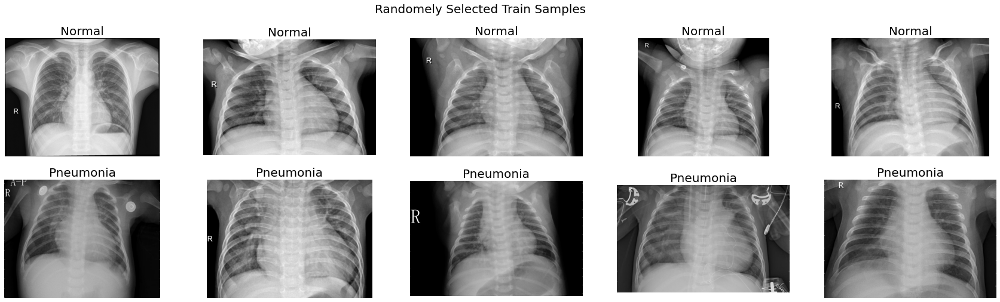

In [12]:
rand_samples = random.sample([os.path.join(path+'/train/NORMAL', filename) 
                              for filename in os.listdir(path+'/train/NORMAL')], 5) + \
    random.sample([os.path.join(path+'/train/PNEUMONIA', filename) 
                   for filename in os.listdir(path+'/train/PNEUMONIA')], 5)

plot_samples(rand_samples)
plt.suptitle('Randomely Selected Train Samples', fontsize=20)
plt.show()

As there is a separate folder named validation, I chose to use the corresponding data for validating the results in each epoch. However, I believe that splitting the training data and creating a larger number of validation samples is a better idea since the abovementioned folder only contains 16 samples in total which is not sufficient for conducting such a task. actually validation accuracy and validation loss signals that it produces are not smooth due to the small number of samples. so i suggest using data augmentation to the training data and then splitting the resulting dataset into validation and training sets.





</div>


<font color=red size=4>
Make the data ready for the training. Use data augmentation and transformation. (3 points)

Hint: see this [link](https://pytorch.org/vision/stable/transforms.html).
     </font>
</font>
                <br/>
    </div>


## Data Distribution

It can be observed that the train data is significantly imbalanced, so it is recommented that we upsample the minority class (either by augmentation or repeating the data) or downsample the majority class.

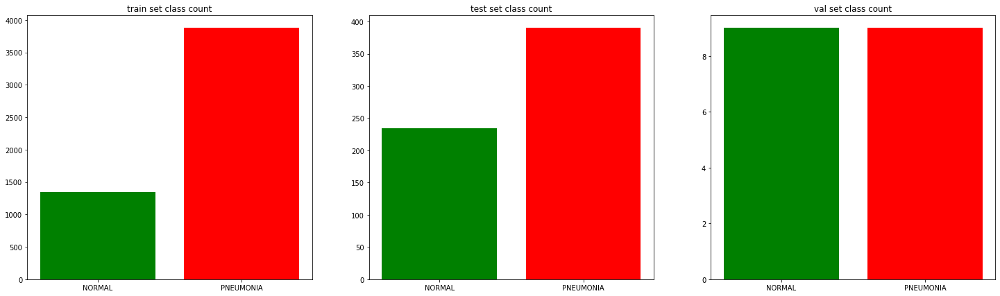

In [13]:
count_instances ={}
fig, axs = plt.subplots(1, 3, figsize= (25,7) )
for idx , dataset_type in enumerate(['train', 'test', 'val']):
  counts =  [  len( [os.path.join(path+f'/{dataset_type}/NORMAL', filename)   for filename in os.listdir(path+f'/{dataset_type}/NORMAL')]) ,
            len([os.path.join(path+f'/{dataset_type}/PNEUMONIA', filename) for filename in os.listdir(path+f'/{dataset_type}/PNEUMONIA')]) ]

  count_instances [dataset_type + '_NORMAL'] = len( [os.path.join(path+f'/{dataset_type}/NORMAL', filename)   for filename in os.listdir(path+f'/{dataset_type}/NORMAL')])
  count_instances [dataset_type + '_PNEUMONIA'] = len( [os.path.join(path+f'/{dataset_type}/PNEUMONIA', filename)   for filename in os.listdir(path+f'/{dataset_type}/PNEUMONIA')])

  axs[idx].bar(classes,counts, color=['green', 'red'])
  axs[idx].set_title( dataset_type + ' set class count')
plt.show()

In [14]:
transformer = {
    'train_transform': transform.Compose([transform.Resize(255),
                                            transform.CenterCrop(224),
                                            transform.RandomHorizontalFlip(),
                                            transform.RandomRotation(10),
                                            transform.RandomGrayscale(),
                                            transform.RandomAffine(translate=(0.05,0.05), degrees=0),
                                            transform.ToTensor()
                                           ]),
    
    'val_transform' : transform.Compose([transform.Resize(255),
                                            transform.CenterCrop(224),
                                            # transform.RandomHorizontalFlip(p=1),
                                            # transform.RandomGrayscale(),
                                            # transform.RandomAffine(translate=(0.1,0.05), degrees=10),
                                            transform.ToTensor()
                                    
                                           ]),
    'test_transform' : transform.Compose([transform.Resize(255),
                                            transform.CenterCrop(224),
                                            # transform.RandomHorizontalFlip(p=0.5),
                                            # transform.RandomRotation(15),
                                            # transform.RandomGrayscale(p=1),
                                            # transform.RandomAffine(translate=(0.08,0.1), degrees=15),
                                            transform.ToTensor()
                                           ]),
}


augmented_train = ImageFolder(path+'/train', transform=transformer['train_transform'])
augmented_test = ImageFolder(path+'/test', transform=transformer['test_transform'])
augmented_val = ImageFolder(path+'/val', transform=transformer['val_transform'])



In [15]:
train_ds, val_ds = train_test_split(augmented_train, test_size=0.2, random_state=42)
len(train_ds), len(val_ds)

(4172, 1044)

# balancing an imbalance dataset


</div>


<font color=red size=4>
Explain what you can do to balance the data (if it is imbalanced) or avoid overfitting. (2 points)
     </font>
</font>
                <br/>
    </div>


When we are using an imbalanced dataset, we can oversample the minority class using replacement. This technique is called oversampling. Similarly, we can randomly delete rows from the majority class to match them with the minority class which is called undersampling.

# C) Data balancing (5 points)

here we chose to conduc  oversampling by generating batches of almost balanced samples.

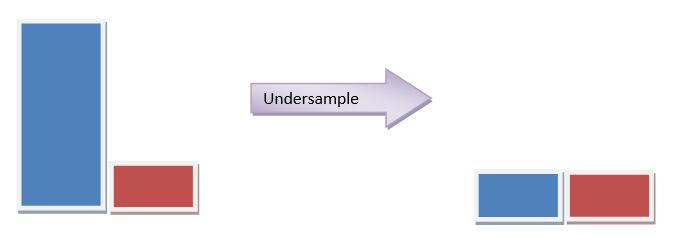

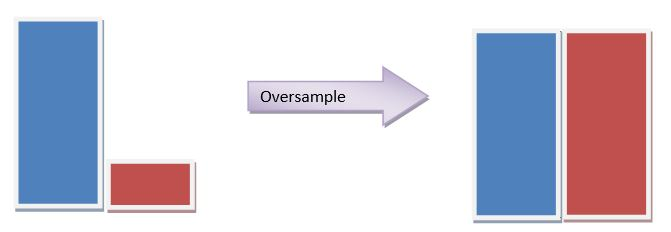

# balancing the data


</div>


<font color=red size=4>
Implement your idea. (3 points)
     </font>
</font>
                <br/>
    </div>



Weighted random choices mean selecting random elements from a list or an array by the probability of that element. We can assign a probability to each element and according to that element(s) will be selected. By this, we can equalize the number of each label in batches.

In [16]:
weight = 1. / np.array([count_instances['train_NORMAL'] , count_instances['train_PNEUMONIA']])
samples_weight = weight[augmented_train.targets]
samples_weight = torch.from_numpy(samples_weight)
sampler = WeightedRandomSampler(samples_weight, len(samples_weight))
train_loader = DataLoader(
    augmented_train, batch_size=BATCH_SIZE, num_workers=1, sampler=sampler)

In [17]:
weight = 1. / np.array([count_instances['test_NORMAL'] , count_instances['test_PNEUMONIA']])
samples_weight = weight[augmented_test.targets]
samples_weight = torch.from_numpy(samples_weight)
sampler = WeightedRandomSampler(samples_weight, len(samples_weight))
test_loader = DataLoader(
    augmented_test, batch_size=BATCH_SIZE, num_workers=1, sampler=sampler)

In [18]:
weight = 1. / np.array([count_instances['val_NORMAL'] , count_instances['val_PNEUMONIA']])
samples_weight = weight[augmented_val.targets]
samples_weight = torch.from_numpy(samples_weight)
sampler = WeightedRandomSampler(samples_weight, len(samples_weight))
val_loader = DataLoader(
    augmented_val, batch_size=BATCH_SIZE//2, num_workers=1, sampler=sampler)

The following image shows a batch of the augmented images.

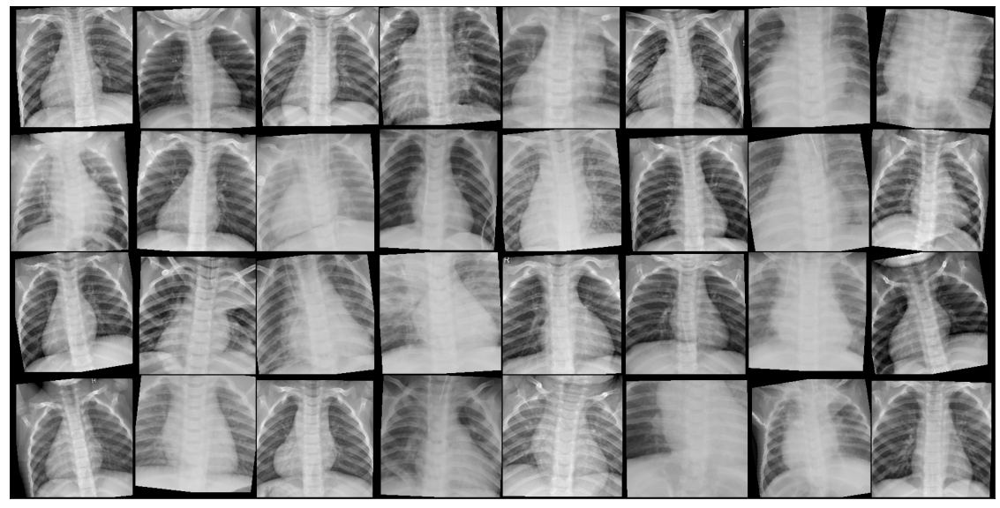

In [19]:
show_batch(train_loader)

# B) Model (25 + 5 points):

Residual connections or shortcut connections are those skipping one or
more layers. In the introduced paper, the shortcut connections simply
perform identity mapping, and their outputs are added to
the outputs of the stacked layers
In the introduced paper, some of the benefits of residual networks are mentioned including:
 - being able to implement deeper networks 
 - easier optimization
 - gaining accuracy from the deepest neurons in the structure
 - residual connections solve the problem of accuracy saturation and degradation as the networks get deeper 

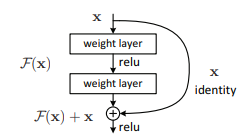

In [30]:
def train(model, criterion, optimizer, scheduler, epochs):
  since = time.time()
  best_model = copy.deepcopy(model.state_dict())
  best_acc = 0.0
  for epoch in range(epochs):
    # print("epoch number: {epoch}")
    for phase in ['train', 'val']:
      if phase == 'train':
        model.train()
      else:
        model.eval()
      
      running_loss = 0.0
      running_corrects = 0.0

      for inputs, labels in data_loaders[phase]:
        inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)

        optimizer.zero_grad()

        with torch.set_grad_enabled(phase=='train'):
          outp = model(inputs)
          _, pred = torch.max(outp, 1)
          loss = criterion(outp, labels)
        
          if phase == 'train':
            loss.backward()
            optimizer.step()
        
        running_loss += loss.item()*inputs.size(0)
        running_corrects += torch.sum(pred == labels.data)
      

      epoch_loss = running_loss / dataset_sizes[phase]
      epoch_acc = running_corrects.double()/dataset_sizes[phase]
      losses[phase].append(epoch_loss)
      accuracies[phase].append(epoch_acc)
      if phase == 'train':
        print('Epoch: {}/{}'.format(epoch+1, epochs))
      print('{} - loss: {:.3f}, accuracy: {:.3f}'.format(phase, epoch_loss, epoch_acc))
    
      if phase == 'val':
        print('Time: {:.3f}m {:.3f}s'.format((time.time()- since)//60, (time.time()- since)%60))
            
      if phase == 'val' and epoch_acc > best_acc:
        best_acc = epoch_acc
        best_model = copy.deepcopy(model.state_dict())

    scheduler.step()  
    print('-' * 30)

  time_elapsed = time.time() - since
  print('Training Time {:.3f}m {:.3f}s'.format(time_elapsed//60, time_elapsed%60)) 
  print('Best accuracy {}'.format(best_acc))

  torch.save(best_model, SAVING_PATH)

  model.load_state_dict(best_model)
  return model   

#advantages of residual networks



</div>


<font color=red size=4>

Describe what the advantages of this network are over the other others. (5 points)
     </font>
</font>
                <br/>
    </div>


Using DenseNet has many advantages, strong gradient flow thus good for dealing with vanishing gradients, the number of layers and parameters is not very large, conv layers highlight more diverse features, the lower conv layers take into account the low, complex patterns from the upper layers, which can be useful for detecting some low-level patterns. It also helps DenseNet learn better on small datasets.


#implementing a residual network



</div>


<font color=red size=4>

Implement the model. (5 points)
You can read about the residual neural networks in this [paper] (https://arxiv.org/abs/1512.03385).
     </font>
</font>
                <br/>
    </div>


## implement densenet from scratch

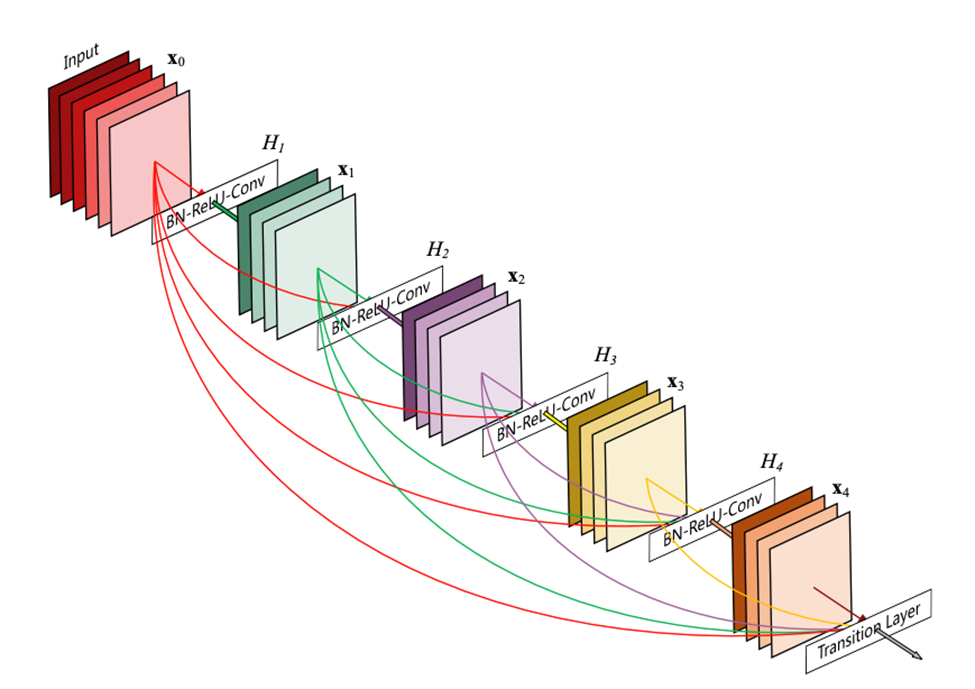

In [31]:
class _Transition(nn.Sequential):
    def __init__(self, num_input_features, num_output_features):
        super(_Transition, self).__init__()
        self.add_module('norm', nn.BatchNorm2d(num_input_features))
        self.add_module('relu', nn.ReLU(inplace=True))
        self.add_module('conv', nn.Conv2d(num_input_features, num_output_features,
                                          kernel_size=1, stride=1, bias=False))
        self.add_module('pool', nn.AvgPool2d(kernel_size=2, stride=2))

In [32]:
class _DenseLayer(nn.Module):
    def __init__(self, num_input_features, growth_rate, bn_size, drop_rate, memory_efficient=False):
        super(_DenseLayer, self).__init__()
        self.add_module('norm1', nn.BatchNorm2d(num_input_features)),
        self.add_module('relu1', nn.ReLU(inplace=True)),
        self.add_module('conv1', nn.Conv2d(num_input_features, bn_size *
                                           growth_rate, kernel_size=1, stride=1,
                                           bias=False)),
        self.add_module('norm2', nn.BatchNorm2d(bn_size * growth_rate)),
        self.add_module('relu2', nn.ReLU(inplace=True)),
        self.add_module('conv2', nn.Conv2d(bn_size * growth_rate, growth_rate,
                                           kernel_size=3, stride=1, padding=1,
                                           bias=False)),
        self.drop_rate = float(drop_rate)
        self.memory_efficient = memory_efficient

    def bn_function(self, inputs):
        "Bottleneck function"
        # type: (List[Tensor]) -> Tensor
        concated_features = torch.cat(inputs, 1)
        bottleneck_output = self.conv1(self.relu1(self.norm1(concated_features)))  # noqa: T484
        return bottleneck_output

    def forward(self, input):  # noqa: F811
        if isinstance(input, Tensor):
            prev_features = [input]
        else:
            prev_features = input

        bottleneck_output = self.bn_function(prev_features)
        new_features = self.conv2(self.relu2(self.norm2(bottleneck_output)))
        if self.drop_rate > 0:
            new_features = F.dropout(new_features, p=self.drop_rate,
                                     training=self.training)
        return new_features

In [33]:
class _DenseBlock(nn.ModuleDict):
    _version = 2

    def __init__(self, num_layers, num_input_features, bn_size, growth_rate, drop_rate, memory_efficient=False):
        super(_DenseBlock, self).__init__()
        for i in range(num_layers):
            layer = _DenseLayer(
                num_input_features + i * growth_rate,
                growth_rate=growth_rate,
                bn_size=bn_size,
                drop_rate=drop_rate,
                memory_efficient=memory_efficient,
            )
            self.add_module('denselayer%d' % (i + 1), layer)

    def forward(self, init_features):
        features = [init_features]
        for name, layer in self.items():
            new_features = layer(features)
            features.append(new_features)
        return torch.cat(features, 1)

In [34]:
class DenseNet(nn.Module):
    def __init__(self, growth_rate=32, block_config=(6, 12, 24, 16),
                 num_init_features=64, bn_size=4, drop_rate=0, num_classes=1000, memory_efficient=False):

        super(DenseNet, self).__init__()

        # Convolution and pooling part from table-1
        self.features = nn.Sequential(OrderedDict([
            ('conv0', nn.Conv2d(3, num_init_features, kernel_size=7, stride=2,
                                padding=3, bias=False)),
            ('norm0', nn.BatchNorm2d(num_init_features)),
            ('relu0', nn.ReLU(inplace=True)),
            ('pool0', nn.MaxPool2d(kernel_size=3, stride=2, padding=1)),
        ]))

        # Add multiple denseblocks based on config 
        # for densenet-121 config: [6,12,24,16]
        num_features = num_init_features
        for i, num_layers in enumerate(block_config):
            block = _DenseBlock(
                num_layers=num_layers,
                num_input_features=num_features,
                bn_size=bn_size,
                growth_rate=growth_rate,
                drop_rate=drop_rate,
                memory_efficient=memory_efficient
            )
            self.features.add_module('denseblock%d' % (i + 1), block)
            num_features = num_features + num_layers * growth_rate
            if i != len(block_config) - 1:
                # add transition layer between denseblocks to 
                # downsample
                trans = _Transition(num_input_features=num_features,
                                    num_output_features=num_features // 2)
                self.features.add_module('transition%d' % (i + 1), trans)
                num_features = num_features // 2

        # Final batch norm
        self.features.add_module('norm5', nn.BatchNorm2d(num_features))

        # Linear layer
        self.classifier = nn.Linear(num_features, num_classes)

        # Official init from torch repo.
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        features = self.features(x)
        out = F.relu(features, inplace=True)
        out = F.adaptive_avg_pool2d(out, (1, 1))
        out = torch.flatten(out, 1)
        out = self.classifier(out)
        return out

In [35]:
def _densenet(arch, growth_rate, block_config, num_init_features, pretrained, progress,
              **kwargs):
    model = DenseNet(growth_rate, block_config, num_init_features, **kwargs)
    return model

def densenet121(pretrained=False, progress=True, **kwargs):
    return _densenet('densenet121', 32, (6, 12, 24, 16), 64, pretrained, progress,
                     **kwargs)

In [36]:
densenet_from_scratch  =densenet121()
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
densenet_from_scratch.to(DEVICE)

dataset_sizes = {'train' : len(augmented_train), 'test':  len(augmented_test) , 'val' : len(augmented_val)}


data_loaders = {'train':train_loader, 'val':val_loader, 'test': test_loader}
batches_count ={'train':len(train_loader), 'val':len(val_loader), 'test': len(test_loader)}

losses = {'train':[], 'val':[]}
accuracies = {'train':[], 'val':[]}

criterion = nn.CrossEntropyLoss()



optimizer = torch.optim.Adam(densenet_from_scratch.parameters(), lr = 0.001)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 4, gamma=0.1)

In [37]:
SAVING_PATH = '/content/implemented_from_scratch_best_model_balanced.pt'

In [38]:
epochs = 10
densenet_from_scratch = train(densenet_from_scratch, criterion, optimizer, scheduler, epochs)

Epoch: 1/10
train - loss: 0.364, accuracy: 0.907
val - loss: 6.774, accuracy: 0.500
Time: 2.000m 22.082s
------------------------------
Epoch: 2/10
train - loss: 0.177, accuracy: 0.932
val - loss: 1.004, accuracy: 0.750
Time: 4.000m 39.764s
------------------------------
Epoch: 3/10
train - loss: 0.152, accuracy: 0.943
val - loss: 1.576, accuracy: 0.812
Time: 6.000m 59.167s
------------------------------
Epoch: 4/10
train - loss: 0.153, accuracy: 0.943
val - loss: 1.312, accuracy: 0.750
Time: 9.000m 42.004s
------------------------------
Epoch: 5/10
train - loss: 0.110, accuracy: 0.958
val - loss: 0.717, accuracy: 0.750
Time: 12.000m 26.706s
------------------------------
Epoch: 6/10
train - loss: 0.102, accuracy: 0.958
val - loss: 0.533, accuracy: 0.750
Time: 15.000m 21.601s
------------------------------
Epoch: 7/10
train - loss: 0.091, accuracy: 0.965
val - loss: 0.201, accuracy: 0.875
Time: 17.000m 56.219s
------------------------------
Epoch: 8/10
train - loss: 0.091, accuracy: 0.

In [39]:
optimizer = torch.optim.Adam(densenet_from_scratch.parameters(), lr = 0.0001)
densenet_from_scratch.to(DEVICE)
grad_clip = None
weight_decay = 1e-4
epochs = 10
densenet_from_scratch = train(densenet_from_scratch, criterion, optimizer, scheduler, epochs)

Epoch: 1/10
train - loss: 0.089, accuracy: 0.964
val - loss: 0.514, accuracy: 0.875
Time: 2.000m 27.644s
------------------------------
Epoch: 2/10
train - loss: 0.095, accuracy: 0.967
val - loss: 0.575, accuracy: 0.688
Time: 4.000m 56.898s
------------------------------
Epoch: 3/10
train - loss: 0.079, accuracy: 0.968
val - loss: 0.844, accuracy: 0.625
Time: 7.000m 25.876s
------------------------------
Epoch: 4/10
train - loss: 0.081, accuracy: 0.968
val - loss: 0.737, accuracy: 0.750
Time: 9.000m 57.989s
------------------------------
Epoch: 5/10
train - loss: 0.075, accuracy: 0.971
val - loss: 0.083, accuracy: 1.000
Time: 12.000m 35.404s
------------------------------
Epoch: 6/10
train - loss: 0.071, accuracy: 0.974
val - loss: 1.077, accuracy: 0.625
Time: 14.000m 56.482s
------------------------------
Epoch: 7/10
train - loss: 0.080, accuracy: 0.969
val - loss: 0.505, accuracy: 0.812
Time: 17.000m 20.243s
------------------------------
Epoch: 8/10
train - loss: 0.068, accuracy: 0.





</div>


<font color=red size=4>

Describe what the advantages of this network are over the other others. (5 points)
     </font>
</font>
                <br/>
    </div>


A pre-trained model is a saved network that was previously trained on a large dataset, typically on a large-scale image-classification task. You either use the pretrained model as is or use transfer learning to customize this model to a given task.

The intuition behind transfer learning for image classification is that if a model is trained on a large and general enough dataset, this model will effectively serve as a generic model of the visual world. You can then take advantage of these learned feature maps without having to start from scratch by training a large model on a large dataset.
transfer learning is when we keep the backbone and only change the classsifier. it is a method when you freeze some layers, and do additional training to the rest of layers to adjust for your purposes and goals. Learning from scratch is a building completely a new model or mixing parts of others, and do training from the first layer. Fine tuning of the network is the process when you adjust parameters such as a learning rate, the number of epochs, the optimizer, regularization parameters etc. to achieve best possible results.
Learning from scratch is a building completely a new model or mixing parts of others, and do training from the first layer. 

training the network with the same parameters used to fine tune the pretrained model leads to less accurate results as the pretrained network has already been trained on a dataset with large number of samples and has learned various features.
also it takes less time to train a model using transfer learning than training it from scratch.

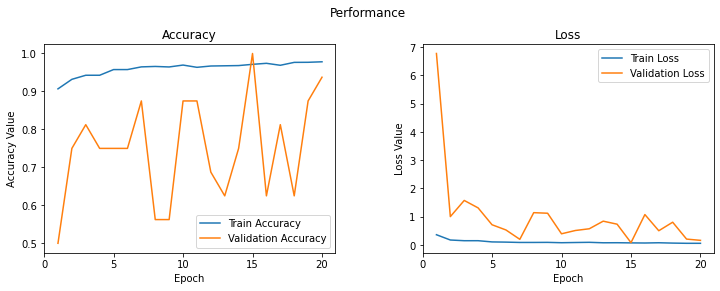

In [47]:
accs_train = [x.cpu() for x in accuracies['train']]
accs_val = [x.cpu() for x in accuracies['val']]
plot_metrics (losses , accs_val , accs_train)

In [53]:
densenet_from_scratch.to(DEVICE)
preds,labels = test_predict(densenet_from_scratch, test_loader)

test_loss: 0.6330, test_acc: 0.8344


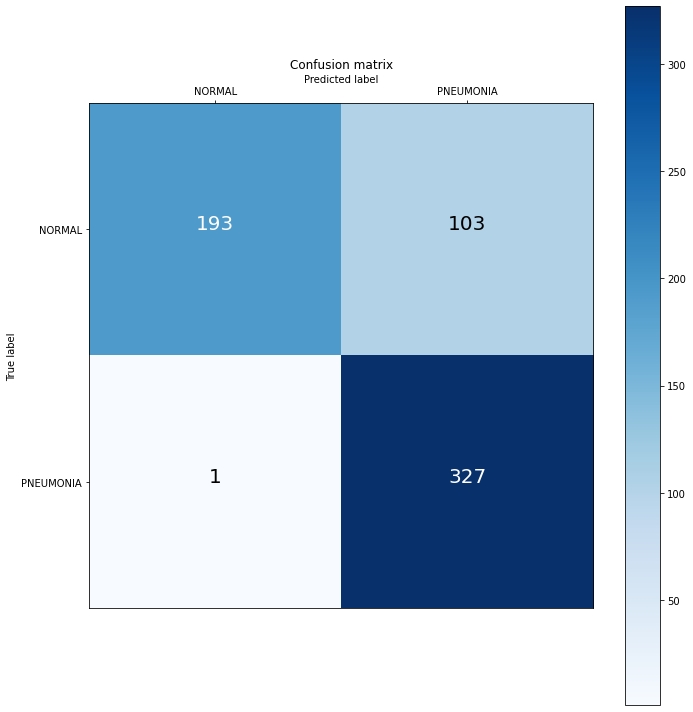

In [54]:
cm  = confusion_matrix(labels, preds)
plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues)


In [55]:
tn, fp, fn, tp = cm.ravel()

accuracy = (np.array(preds) == np.array(labels)).sum() / len(preds)
precision = tp/(tp+fp)
recall = tp/(tp+fn)
f1 = 2*((precision*recall)/(precision+recall))

print("Accuracy of the model is {:.2f}".format(accuracy))
print("Recall of the model is {:.2f}".format(recall))
print("Precision of the model is {:.2f}".format(precision))
print("F1 Score of the model is {:.2f}".format(f1))

Accuracy of the model is 0.83
Recall of the model is 1.00
Precision of the model is 0.76
F1 Score of the model is 0.86


test_loss: 0.9857, test_acc: 0.7656


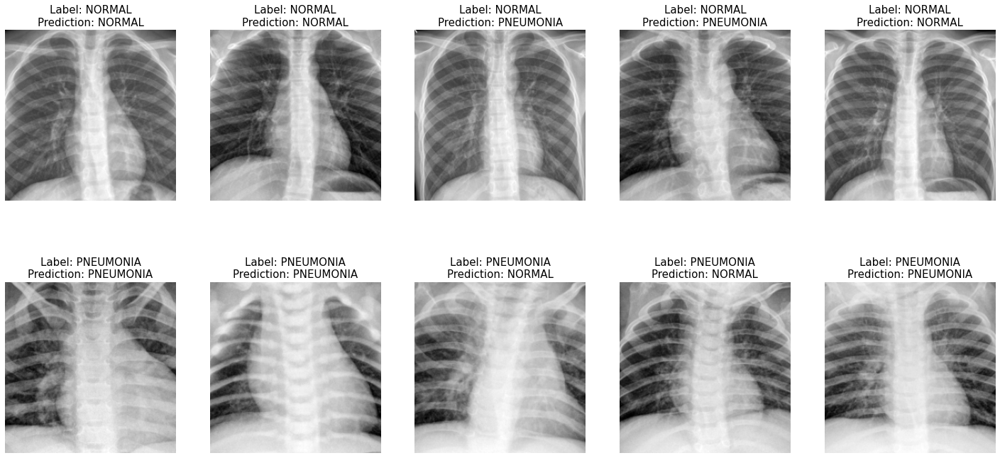

In [69]:
preds,labels = test_predict(densenet_from_scratch, test_loader)
idxs = torch.tensor(np.append(np.arange(start=0, stop=5, step=1), 
                             np.arange(start=500, stop=505, step=1))) 

fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25,12))

for c,i in enumerate(idxs):
    img_tensor, label = augmented_test[i]
    ax[c//5][c%5].imshow(img_tensor[0,:,:], cmap='gray')
    ax[c//5][c%5].set_title('Label: {}\nPrediction: {}'.format(augmented_test.classes[label], augmented_test.classes[preds[i]]),fontsize=15)
    ax[c//5][c%5].axis('off')

#use transfer learning



</div>


<font color=red size=4>

Use transfer leaning. (5 points)
     </font>
</font>
                <br/>
    </div>


##Transfer Learning

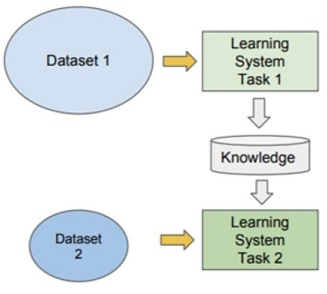

Using transfer learning, we can leverage the models already trained on large corpus datasets and re-train or fine-tune them for smaller tasks.

## Load a Pretrained Model

after importing the pretrained network, we freeze the base model and change the classifier layer or head of the network to according to our dataset's output shape. in other words the last layers provide information specific to the task, so they need to be retrained.

DenseNet has been pretrained on imagenet, thus the classsifier has 1000 outputs, so we modify this layer according to the binary classification task and change the output shape into 2.

for each sample we choose the maximum value at the output layer to be the chosen class for the input image.





</div>


<font color=red size=4>

Use transfer leaning. (5 points)
     </font>
</font>
                <br/>
    </div>


In [56]:
model = torchvision.models.densenet161(pretrained=True)
for param in model.parameters():
    param.requires_grad = False
    
in_features = model.classifier.in_features

model.classifier = nn.Linear(in_features, 2)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=DenseNet161_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet161_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/densenet161-8d451a50.pth" to /root/.cache/torch/hub/checkpoints/densenet161-8d451a50.pth


  0%|          | 0.00/110M [00:00<?, ?B/s]

In [58]:
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
dataset_sizes = {'train' : len(augmented_train), 'test':  len(augmented_test) , 'val' : len(augmented_val)}

data_loaders = {'train':train_loader, 'val':val_loader, 'test': test_loader}
batches_count ={'train':len(train_loader), 'val':len(val_loader), 'test': len(test_loader)}

losses = {'train':[], 'val':[]}
accuracies = {'train':[], 'val':[]}

criterion = nn.CrossEntropyLoss()
#  only the weights of the classifier are optimized.
optimizer = torch.optim.Adam(model.classifier.parameters(), lr = 0.001)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 4, gamma=0.1)

In [59]:
SAVING_PATH = '/content/best_model_balanced.pt'





</div>


<font color=red size=4>

Train the model. (5 points)
     </font>
</font>
                <br/>
    </div>

In [60]:
model.to(DEVICE)
epochs = 10
model = train(model, criterion, optimizer, scheduler, epochs)

Epoch: 1/10
train - loss: 0.303, accuracy: 0.879
val - loss: 0.350, accuracy: 0.938
Time: 2.000m 14.198s
------------------------------
Epoch: 2/10
train - loss: 0.184, accuracy: 0.937
val - loss: 0.340, accuracy: 0.812
Time: 4.000m 28.175s
------------------------------
Epoch: 3/10
train - loss: 0.166, accuracy: 0.939
val - loss: 0.135, accuracy: 1.000
Time: 6.000m 39.759s
------------------------------
Epoch: 4/10
train - loss: 0.139, accuracy: 0.948
val - loss: 0.476, accuracy: 0.688
Time: 9.000m 13.512s
------------------------------
Epoch: 5/10
train - loss: 0.134, accuracy: 0.955
val - loss: 0.303, accuracy: 0.750
Time: 11.000m 28.221s
------------------------------
Epoch: 6/10
train - loss: 0.142, accuracy: 0.949
val - loss: 0.322, accuracy: 0.938
Time: 13.000m 52.317s
------------------------------
Epoch: 7/10
train - loss: 0.133, accuracy: 0.953
val - loss: 0.186, accuracy: 1.000
Time: 16.000m 16.316s
------------------------------
Epoch: 8/10
train - loss: 0.140, accuracy: 0.

After fine-tuning the network, we retrain the whole network by a smaller learning rate in order to increase the performance.

In [61]:
for param in model.parameters():
    param.requires_grad = True
    
optimizer = torch.optim.Adam(model.parameters(), lr = 0.0001)
model.to(DEVICE)
grad_clip = None
weight_decay = 1e-4
epochs = 10
model = train(model, criterion, optimizer, scheduler, epochs)

Epoch: 1/10
train - loss: 0.095, accuracy: 0.965
val - loss: 1.548, accuracy: 0.500
Time: 2.000m 58.076s
------------------------------
Epoch: 2/10
train - loss: 0.075, accuracy: 0.976
val - loss: 0.345, accuracy: 0.812
Time: 5.000m 41.892s
------------------------------
Epoch: 3/10
train - loss: 0.042, accuracy: 0.985
val - loss: 0.496, accuracy: 0.875
Time: 8.000m 25.664s
------------------------------
Epoch: 4/10
train - loss: 0.042, accuracy: 0.986
val - loss: 0.070, accuracy: 1.000
Time: 11.000m 18.380s
------------------------------
Epoch: 5/10
train - loss: 0.024, accuracy: 0.993
val - loss: 0.026, accuracy: 1.000
Time: 14.000m 4.959s
------------------------------
Epoch: 6/10
train - loss: 0.024, accuracy: 0.991
val - loss: 0.024, accuracy: 1.000
Time: 16.000m 40.241s
------------------------------
Epoch: 7/10
train - loss: 0.022, accuracy: 0.993
val - loss: 0.002, accuracy: 1.000
Time: 19.000m 18.136s
------------------------------
Epoch: 8/10
train - loss: 0.021, accuracy: 0.





</div>


<font color=red size=4>

Evaluate your model. Use valid evaluation metrics for it. Analyze the results. (evaluation metrics: 5 points, analysis: 5 points, logical results: 5 points)
     </font>
</font>
                <br/>
    </div>

Cont'd:

as you can see, the asccuracy has a sigificant rise after epoch 10, when we started fine-tuning the whole network with a smaller learning rate.



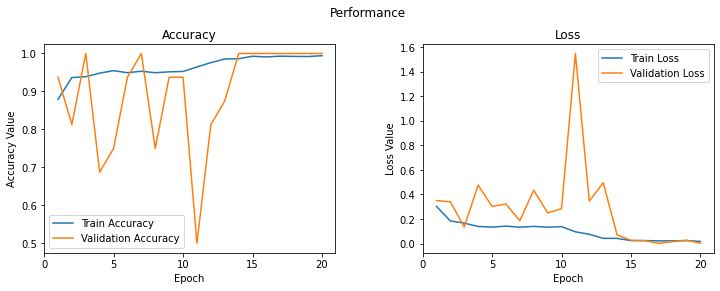

In [62]:
accs_train = [x.cpu() for x in accuracies['train']]
accs_val = [x.cpu() for x in accuracies['val']]
plot_metrics (losses , accs_val , accs_train)

if we had enough number of validation samples, the validation loss and accuracy curves would not be unsmooth with sharp peaks and would be more similar to training curves.

In [109]:
model.to(DEVICE)
preds,labels = test_predict(model, test_loader)

test_loss: 0.4675, test_acc: 0.8687


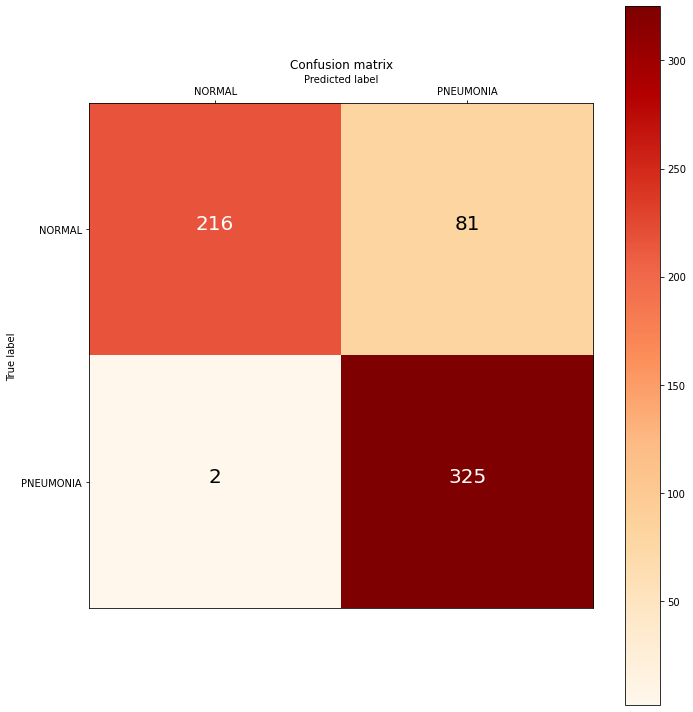

In [110]:
cm  = confusion_matrix(labels, preds)
plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.OrRd)


### Other Metrics

In [111]:
tn, fp, fn, tp = cm.ravel()

accuracy = (np.array(preds) == np.array(labels)).sum() / len(preds)
precision = tp/(tp+fp)
recall = tp/(tp+fn)
f1 = 2*((precision*recall)/(precision+recall))

print("Accuracy of the model is {:.2f}".format(accuracy))
print("Recall of the model is {:.2f}".format(recall))
print("Precision of the model is {:.2f}".format(precision))
print("F1 Score of the model is {:.2f}".format(f1))

Accuracy of the model is 0.87
Recall of the model is 0.99
Precision of the model is 0.80
F1 Score of the model is 0.89


## Visualizing the Results

test_loss: 0.3534, test_acc: 0.9016


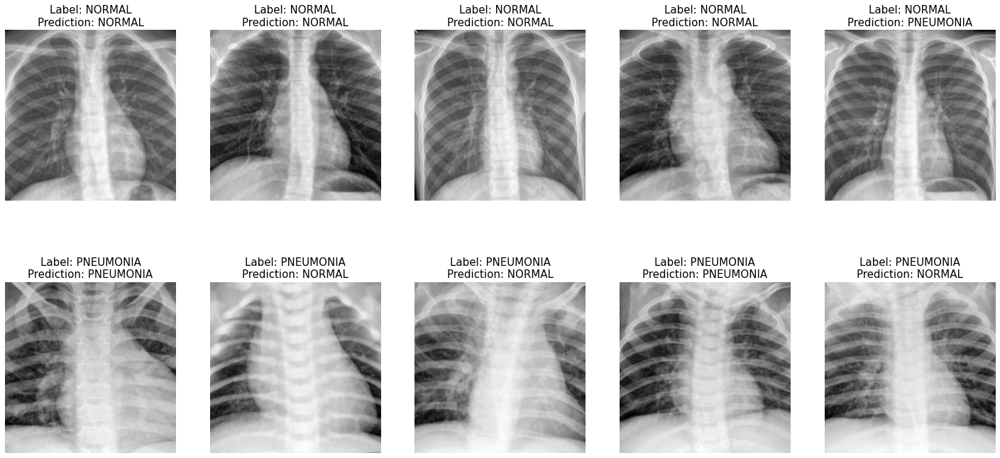

In [68]:
preds,labels = test_predict(model, test_loader)
idxs = torch.tensor(np.append(np.arange(start=0, stop=5, step=1), 
                             np.arange(start=500, stop=505, step=1))) 

fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25,12))

for c,i in enumerate(idxs):
    img_tensor, label = augmented_test[i]
    ax[c//5][c%5].imshow(img_tensor[0,:,:], cmap='gray')
    ax[c//5][c%5].set_title('Label: {}\nPrediction: {}'.format(augmented_test.classes[label], augmented_test.classes[preds[i]]),fontsize=15)
    ax[c//5][c%5].axis('off')

In the following section we represent the decisons made by the network and how confident it is in making those decisions.

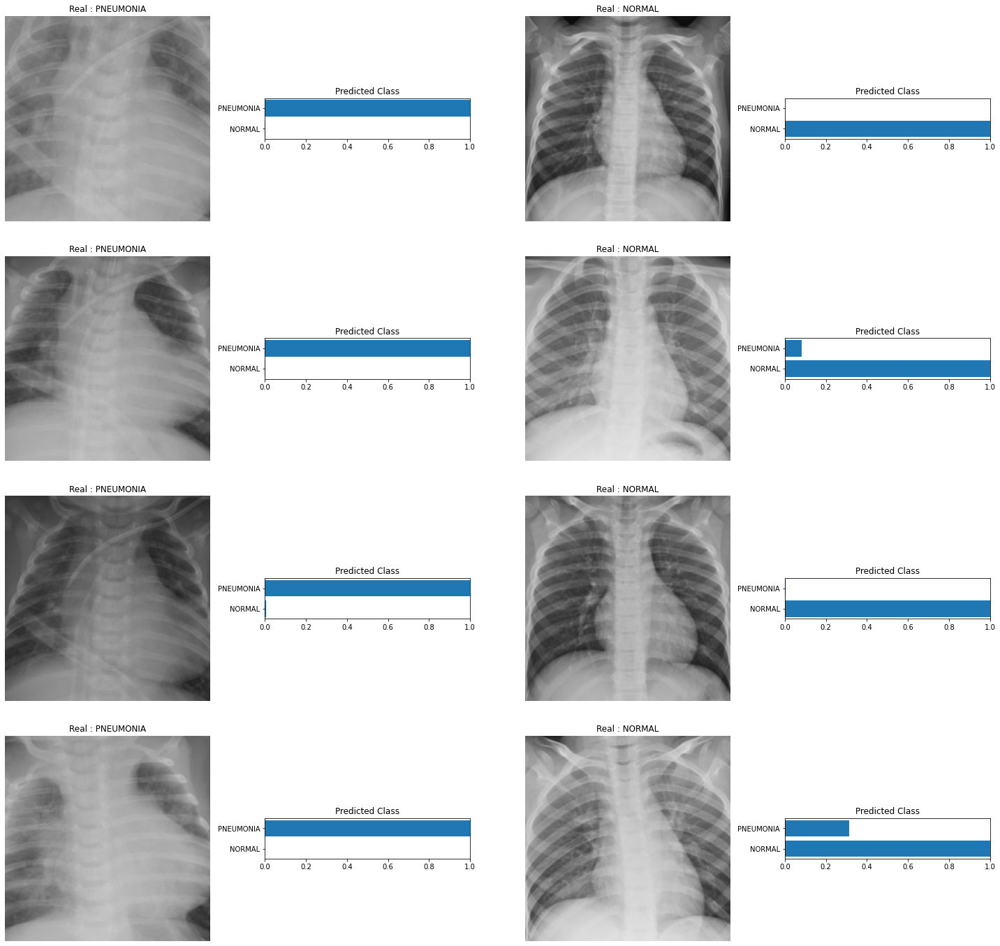

In [70]:
fig, ax = plt.subplots(figsize=(20,20), ncols=4, nrows=4)

for row in range(4):
    img,label = augmented_test[300+row]
    pred = torch.exp(model(img.to(DEVICE).unsqueeze(0)))
    pred = pred.cpu().data.numpy().squeeze()
    ax[row][0].imshow(img.permute(1, 2, 0))
    ax[row][0].set_title('Real : {}'.format(classes[label]))
    ax[row][0].axis('off')
    ax[row][1].barh(classes, pred)
    ax[row][1].set_aspect(0.1)
    ax[row][1].set_yticks(classes)
    ax[row][1].set_yticklabels(classes)
    ax[row][1].set_title('Predicted Class')
    ax[row][1].set_xlim(0, 1.)
    plt.tight_layout()


    img,label = augmented_test[100+row]
    pred = torch.exp(model(img.to(DEVICE).unsqueeze(0)))
    pred = pred.cpu().data.numpy().squeeze()
    ax[row][2].imshow(img.permute(1, 2, 0))
    ax[row][2].set_title('Real : {}'.format(classes[label]))
    ax[row][2].axis('off')
    ax[row][3].barh(classes, pred)
    ax[row][3].set_aspect(0.1)
    ax[row][3].set_yticks(classes)
    ax[row][3].set_yticklabels(classes)
    ax[row][3].set_title('Predicted Class')
    ax[row][3].set_xlim(0, 1.)
    plt.tight_layout()

# C) Data UNbalancing (5 points)




</div>


<font color=red size=4>

Explain what you can do to balance the data (if it is imbalanced) or avoid overfitting. (2 points)
     </font>
</font>
                <br/>
    </div>

In [ ]:
augmented_train = ImageFolder(path+'/train', transform=transformer['train_transform'])
augmented_test = ImageFolder(path+'/test', transform=transformer['test_transform'])
augmented_val = ImageFolder(path+'/val', transform=transformer['val_transform'])

train_loader = DataLoader(
    augmented_train, batch_size=BATCH_SIZE, num_workers=1, sampler= None)


test_loader = DataLoader(
    augmented_test, batch_size=BATCH_SIZE, num_workers=1, sampler=None)



val_loader = DataLoader(
    augmented_val, batch_size=BATCH_SIZE//2, num_workers=1, sampler=None)

In [ ]:
unbalanced_model = torchvision.models.densenet161(pretrained=True)
for param in unbalanced_model.parameters():
    param.requires_grad = False
    
in_features = unbalanced_model.classifier.in_features

unbalanced_model.classifier = nn.Linear(in_features, 2)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=DenseNet161_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet161_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
dataset_sizes = {'train' : len(augmented_train), 'test':  len(augmented_test) , 'val' : len(augmented_val)}

data_loaders = {'train':train_loader, 'val':val_loader, 'test': test_loader}
batches_count ={'train':len(train_loader), 'val':len(val_loader), 'test': len(test_loader)}

losses = {'train':[], 'val':[]}
accuracies = {'train':[], 'val':[]}

criterion = nn.CrossEntropyLoss()
#  only the weights of the classifier are optimized.
optimizer = torch.optim.Adam(unbalanced_model.classifier.parameters(), lr = 0.001)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 4, gamma=0.1)

In [ ]:
SAVING_PATH = '/content/best_moel_unbalanced.pt'

In [ ]:
unbalanced_model.to(DEVICE)
epochs = 10
unbalanced_model = train(unbalanced_model, criterion, optimizer, scheduler, epochs)

Epoch: 1/10
train - loss: 0.357, accuracy: 0.944
val - loss: 9.502, accuracy: 0.500
Time: 1.000m 46.167s
------------------------------
Epoch: 2/10
train - loss: 2.055, accuracy: 0.840
val - loss: 11.840, accuracy: 0.500
Time: 3.000m 29.569s
------------------------------
Epoch: 3/10
train - loss: 2.525, accuracy: 0.820
val - loss: 11.344, accuracy: 0.500
Time: 5.000m 13.352s
------------------------------
Epoch: 4/10
train - loss: 2.446, accuracy: 0.818
val - loss: 11.090, accuracy: 0.500
Time: 6.000m 57.023s
------------------------------
Epoch: 5/10
train - loss: 4.426, accuracy: 0.743
val - loss: 5.113, accuracy: 0.500
Time: 8.000m 40.370s
------------------------------
Epoch: 6/10
train - loss: 1.704, accuracy: 0.733
val - loss: 1.898, accuracy: 0.500
Time: 10.000m 23.791s
------------------------------
Epoch: 7/10
train - loss: 0.649, accuracy: 0.720
val - loss: 1.964, accuracy: 0.500
Time: 12.000m 7.241s
------------------------------
Epoch: 8/10
train - loss: 0.661, accuracy: 0

In [ ]:
for param in unbalanced_model.parameters():
    param.requires_grad = True
    
optimizer = torch.optim.Adam(unbalanced_model.parameters(), lr = 0.0001)
unbalanced_model.to(DEVICE)
grad_clip = None
weight_decay = 1e-4
epochs = 10
unbalanced_model = train(unbalanced_model, criterion, optimizer, scheduler, epochs)

Epoch: 1/10
train - loss: 2.264, accuracy: 0.743
val - loss: 3.331, accuracy: 0.500
Time: 2.000m 24.300s
------------------------------
Epoch: 2/10
train - loss: 1.283, accuracy: 0.743
val - loss: 1.761, accuracy: 0.500
Time: 4.000m 48.864s
------------------------------
Epoch: 3/10
train - loss: 0.679, accuracy: 0.706
val - loss: 2.483, accuracy: 0.500
Time: 7.000m 13.563s
------------------------------
Epoch: 4/10
train - loss: 0.569, accuracy: 0.754
val - loss: 2.590, accuracy: 0.500
Time: 9.000m 37.896s
------------------------------
Epoch: 5/10
train - loss: 0.557, accuracy: 0.740
val - loss: 2.367, accuracy: 0.500
Time: 12.000m 2.105s
------------------------------
Epoch: 6/10
train - loss: 0.582, accuracy: 0.703
val - loss: 2.190, accuracy: 0.500
Time: 14.000m 26.528s
------------------------------
Epoch: 7/10
train - loss: 0.579, accuracy: 0.704
val - loss: 2.209, accuracy: 0.500
Time: 16.000m 50.861s
------------------------------
Epoch: 8/10
train - loss: 0.563, accuracy: 0.6

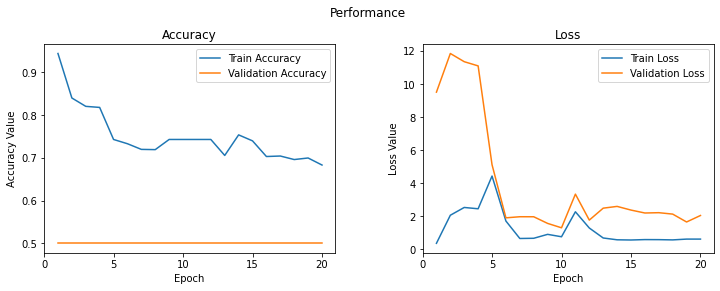

In [ ]:
accs_train = [x.cpu() for x in accuracies['train']]
accs_val = [x.cpu() for x in accuracies['val']]
plot_metrics (losses , accs_val , accs_train)

In [ ]:
unbalanced_model.to(DEVICE)
preds,labels = test_predict(unbalanced_model, test_loader)

test_loss: 0.3665, test_acc: 0.9031


the accuraciy starts to drop after some time (due to unbalanced learning the model classifies unseen inputs with bias) (considering what samples it saw more frequently!)

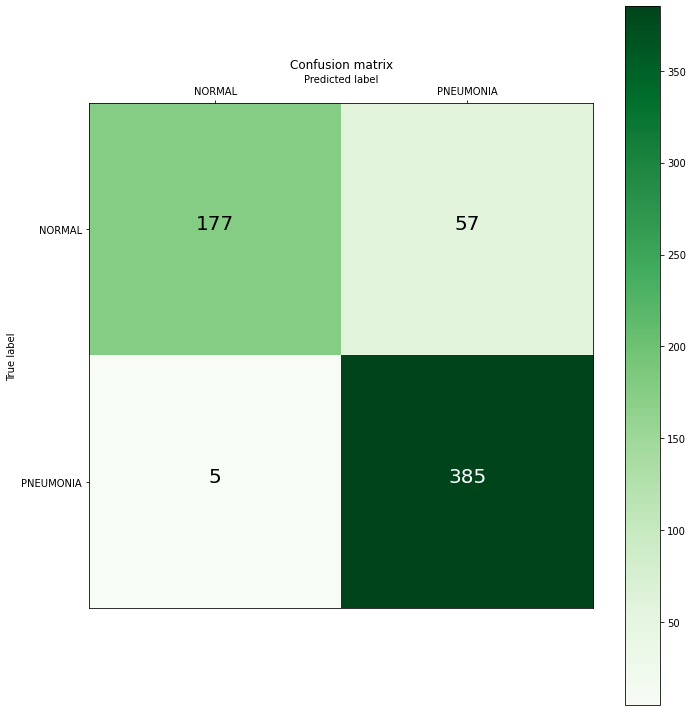

In [ ]:
cm  = confusion_matrix(labels, preds)
plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Greens)


In [ ]:
tn, fp, fn, tp = cm.ravel()

accuracy = (np.array(preds) == np.array(labels)).sum() / len(preds)
precision = tp/(tp+fp)
recall = tp/(tp+fn)
f1 = 2*((precision*recall)/(precision+recall))

print("Accuracy of the model is {:.2f}".format(accuracy))
print("Recall of the model is {:.2f}".format(recall))
print("Precision of the model is {:.2f}".format(precision))
print("F1 Score of the model is {:.2f}".format(f1))

Accuracy of the model is 0.90
Recall of the model is 0.99
Precision of the model is 0.87
F1 Score of the model is 0.93


# D) Interpretation (15 points)




</div>


<font color=red size=4>

Read about interpretability. Describe what the interpretation of the neural networks is. (5 points)
     </font>
</font>
                <br/>
    </div>

Methods of model interpretability have gained growing significance in recent years as a direct consequence of the rise in model complexity and the associated lack of transparency. Model understanding is a hot topic of study and a focal area for practical applications employing machine learning across various sectors.
Interpretation of a network gives us spme insight about what is actually happening, so it can be used to detect failurs ahead of time, better generalize the model, seperate internal functions of a model, inspect the performance of the model, debugg the model and make explanations.


It can be done in two ways, interpreting models, interpreting decisions.

The idea was intially introduced by Lee Sehol who was working on AlphaGo game, he realized that there are some non-human moves in the cgame, and he tried to figure out where they come from.

]It can be used in for debugging the actions taken in self driving cars to realize why specific decisions are made, or to find adversarial features.

It can be used in disease diagnosis to realize why the machine classified the tumor as a particular type or why it prescribed that set of medicine.


briefly, it helps us Make some interpretable information extraction and inspect the things that are happening inside the model.



</div>


<font color=red size=4>

Read about interpretation methods in this [paper](https://arxiv.org/abs/1710.10547) or any other resources. Decide which interpretation method you will use, and explain it. (5 points)
     </font>
</font>
                <br/>
    </div>

Interpretation of Neural Networks is Fragile:

this paper gives some insight about how we can use neural network interpretation approachs to implement more robust models.

the main idea behind this paper is that using saliency maps or other interpretation methods for various examples gives us insight about what the model has learned to focus on.

if different examples show seperate regions to focus that have no intersection, this shows that the network hasnt been trained efficiently.


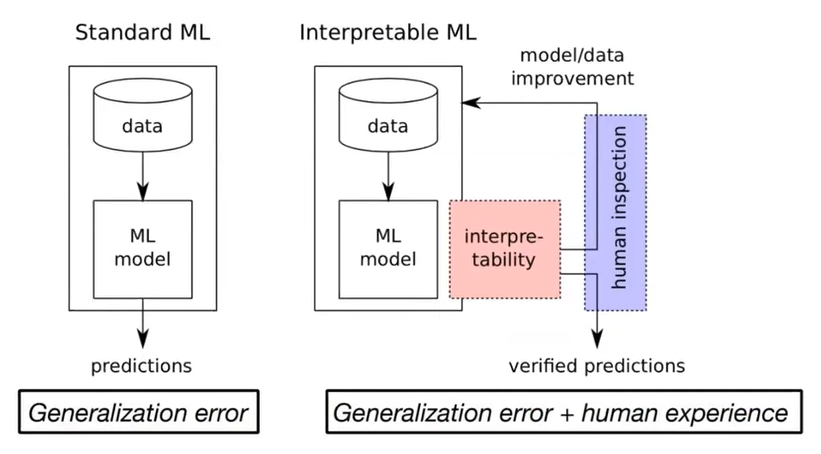

Integrated Gradients


Let's say we have a formal representation of a deep network, F : Rn → [0, 1].
Let x ∈ Rn be the current input and x′ ∈ Rn be the baseline input.
The baseline in image networks might be the black image, whereas it might be the zero embedding vector in text models.
From the baseline x′ to the input x, we compute gradients at all points along the straight-line path (in Rn). By cumulating these gradients, one can generate integrated gradients. Integrated gradients are defined as the path integral of gradients along a direct path from the baseline x′ to the input x.


The two basic assumptions, sensitivity, and implementation invariance, form the basis of this method. Please refer to the original paper to learn more about these axioms.




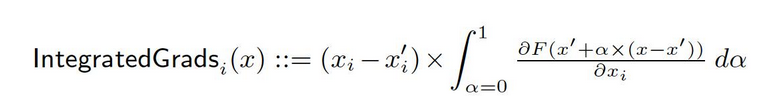

Simple gradient method

was introduced in 2010 and applied to DNNs in 2013, it applies a first order linear approximation of the model to detect the sensitivity of the score to perturbing each of the input dimensions. Thiss score is defined as:

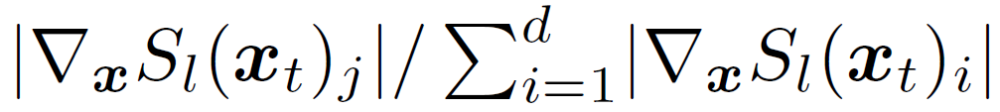

Gradient SHAP 

is a gradient method to compute SHAP values, which are based on Shapley values proposed in cooperative game theory. Gradient SHAP adds Gaussian noise to each input sample multiple times, selects a random point along the path between baseline and input, and computes the gradient of outputs with respect to those selected random points. The final SHAP values represent the expected value of gradients * (inputs - baselines).

The computed attributions approximate SHAP values under the assumptions that the input features are independent and that the explanation model is linear between the inputs and given baselines.

DeepLIFT

DeepLIFT is a back-propagation based approach that attributes a change to inputs based on the differences between the inputs and corresponding references (or baselines) for non-linear activations. As such, DeepLIFT seeks to explain the difference in the output from reference in terms of the difference in inputs from reference. DeepLIFT uses the concept of multipliers to "blame" specific neurons for the difference in output. The definition of a multiplier is as follows

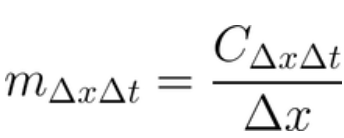

DeepLIFT SHAP

DeepLIFT SHAP is a method extending DeepLIFT to approximate SHAP values, which are based on Shapley values proposed in cooperative game theory. DeepLIFT SHAP takes a distribution of baselines and computes the DeepLIFT attribution for each input-baseline pair and averages the resulting attributions per input example.

Saliency

Saliency is a simple approach for computing input attribution, returning the gradient of the output with respect to the input. This approach can be understood as taking a first-order Taylor expansion of the network at the input, and the gradients are simply the coefficients of each feature in the linear representation of the model. The absolute value of these coefficients can be taken to represent feature importance

Input X Gradient

Input X Gradient is an extension of the saliency approach, taking the gradients of the output with respect to the input and multiplying by the input feature values. One intuition for this approach considers a linear model; the gradients are simply the coefficients of each input, and the product of the input with a coefficient corresponds to the total contribution of the feature to the linear model's output.

Guided Backpropagation and Deconvolution

Guided backpropagation and deconvolution compute the gradient of the target output with respect to the input, but backpropagation of ReLU functions is overridden so that only non-negative gradients are backpropagated. In guided backpropagation, the ReLU function is applied to the input gradients, and in deconvolution, the ReLU function is applied to the output gradients and directly backpropagated. Both approaches were proposed in the context of a convolutional network and are generally used for convolutional networks, although they can be applied generically.

Guided GradCAM


Guided GradCAM computes the element-wise product of guided backpropagation attributions with upsampled (layer) GradCAM attributions. GradCAM attributions are computed with respect to a given layer, and attributions are upsampled to match the input size. This approach is designed for convolutional neural networks. The chosen layer is often the last convolutional layer in the network, but any layer that is spatially aligned with the input can be provided

Feature Ablation

Feature ablation is a perturbation based approach to compute attribution, involving replacing each input feature with a given baseline / reference value (e.g. 0), and computing the difference in output. Input features can also be grouped and ablated together rather than individually. This can be used in a variety of applications. For example, for images, one can group an entire segment or region and ablate it together, measuring the importance of the segment (feature group).


Feature Permutation

Feature permutation is a perturbation based approach which takes each feature individually, randomly permutes the feature values within a batch and computes the change in output (or loss) as a result of this modification. Like feature ablation, input features can also be grouped and shuffled together rather than individually. Note that unlike other algorithms in Captum, this algorithm only provides meaningful attributions when provided with a batch of multiple input examples, as opposed to other algorithms, where a single example is sufficient.

Occlusion

Occlusion is a perturbation based approach to compute attribution, involving replacing each contiguous rectangular region with a given baseline / reference, and computing the difference in output. For features located in multiple regions (hyperrectangles), the corresponding output differences are averaged to compute the attribution for that feature. Occlusion is most useful in cases such as images, where pixels in a contiguous rectangular region are likely to be highly correlated.

Shapley Value Sampling

Shapley value is an attribution method based on a concept from cooperative game theory. This method involves taking each permutation of the input features and adding them one-by-one to a given baseline. The output difference after adding each feature corresponds to its contribution, and these differences are averaged over all permutations to obtain the attribution.

Since this method is extremely computationally intensive for larger numbers of features, we also implement Shapley Value Sampling, where we sample some random permutations and average the marginal contribution of features based on these permutations. Like feature ablation, input features can also be grouped and added together rather than individually.

Lime

Lime is an interpretability method that trains an interpretable surrogate model by sampling data points around a specified input example and using model evaluations at these points to train a simpler interpretable 'surrogate' model, such as a linear model.

We offer two implementation variants of this method, LimeBase and Lime. LimeBase provides a generic framework to train a surrogate interpretable model. This differs from most API of other attribution methods, since the method returns a representation of the interpretable model (e.g. coefficients of the linear model). On the other hand, Lime provides a more specific implementation than LimeBase in order to expose a consistent API with other perturbation-based algorithms.

KernelSHAP

Kernel SHAP is a method that uses the LIME framework to compute Shapley Values. Setting the loss function, weighting kernel and regularization terms appropriately in the LIME framework allows theoretically obtaining Shapley Values more efficiently than directly computing Shapley Values.

there are other examples mostly belonging to layer and neuron attribution categories including: Layer Conductance, Internal Influence, Layer Activation, Layer Gradient X Activation, GradCAM, Layer Integrated Gradients, Layer gradientSHAP, Layer DeepLIFT, Layer DeepLIFT SHAP, Layer Feature Ablation, Neuron Conductance, Neuron Gradient, Neuron Integrated Gradients, Neuron Guided Backpropagation and Deconvolution, Neuron GradientSHAP, Neuron DeepLIFT, Neuron Feature Ablation, and Noise Tunnel.
















</div>


<font color=red size=4>

Implement the method and visualize the output of 10 input images. You may use any available libraries for this matter. You may want to check out [this link](https://github.com/sicara/tf-explain). (5 points)
     </font>
</font>
                <br/>
    </div>

I used captum which is an open source library developed for applyinh SOTA methods of feature attribution algorithms. this library is designed for model interpretability of PyTorch models

using captum we can:

- Attribute the predictions of an image classifier to their corresponding image features.

- Visualize the attribution results.


The attribution algorithms in Captum are separated into three groups, primary attribution, layer attribution and neuron attribution, which are defined as follows:

primary attribution: Determines the contribution of each input feature to a model's output.

Layer Attribution: Each neuron in a particular layer is evaluated for its contribution to the model's output.

Neuron Attribution: A hidden neuron's activation is determined by evaluating the contribution of each input feature.

In [82]:
PATH = '/content/best_model_balanced.pt'

In [86]:
model = torchvision.models.densenet161(pretrained=False)
in_features = model.classifier.in_features
model.classifier = nn.Linear(in_features, 2)

In [88]:
model.load_state_dict(torch.load(PATH))
model.eval()
clear_output()

In [89]:
# check if the model has been loaded correctly
model.to(DEVICE)
preds,labels = test_predict(model, test_loader)


test_loss: 0.3555, test_acc: 0.9078


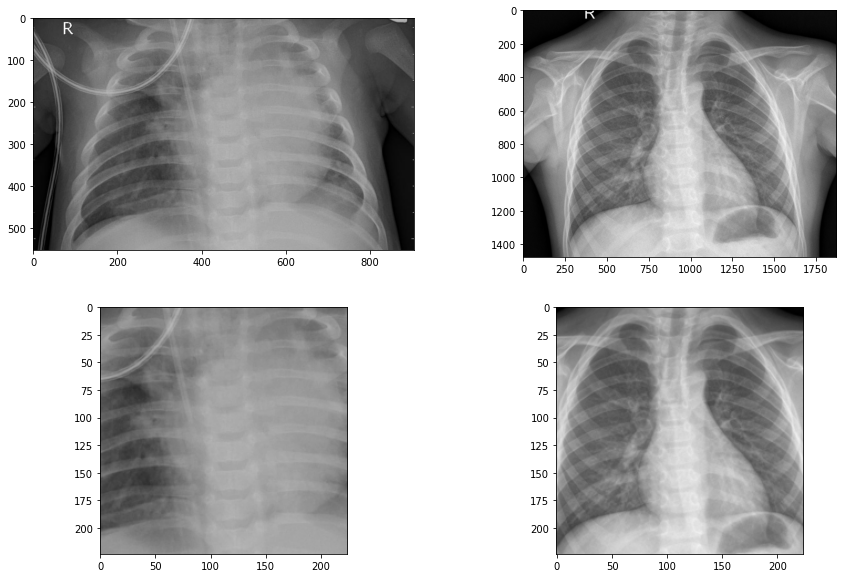

In [90]:
# showing some of the outputs
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

test_img_pneumonia = cv2.imread('/content/chest-xray-pneumonia/chest_xray/test/PNEUMONIA/person100_bacteria_479.jpeg')
test_img_data_pneumonia = np.asarray(test_img_pneumonia)

test_img_normal = cv2.imread('/content/chest-xray-pneumonia/chest_xray/test/NORMAL/IM-0010-0001.jpeg')
test_img_data_normal = np.asarray(test_img_normal)



plt.figure( figsize = (15,10))

plt.subplot(2, 2, 1)
plt.imshow(test_img_data_pneumonia, cmap='gray')

plt.subplot(2, 2, 2)
plt.imshow(test_img_data_normal, cmap = 'gray')


tr = transformer['test_transform']
test_img_pneumonia_pil = Image.fromarray(test_img_pneumonia)
im_pil_pneumonia = tr(test_img_pneumonia_pil)
plt.subplot(2, 2, 3)
sick_transformed_pil_toshow = np.transpose(np.squeeze(im_pil_pneumonia ) , (1,2,0 ))
plt.imshow( sick_transformed_pil_toshow, cmap = 'gray')

test_img_normal_pil = Image.fromarray(test_img_normal)
im_pil_normal = tr(test_img_normal_pil)
plt.subplot(2, 2, 4)
normal_transformed_pil_toshow = np.transpose(np.squeeze(im_pil_normal) , (1,2,0 ))
plt.imshow(normal_transformed_pil_toshow , cmap = 'gray')



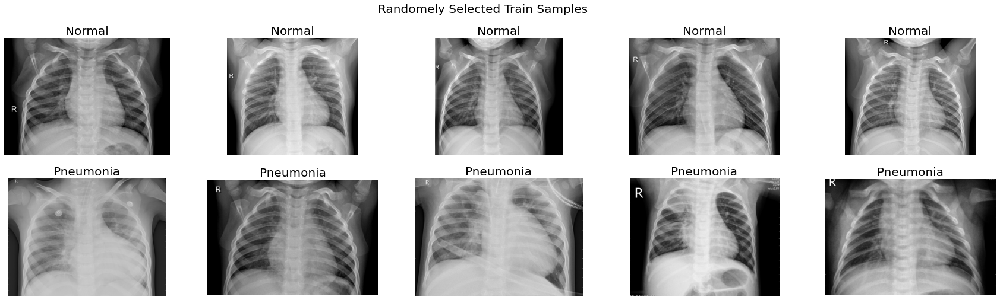

In [91]:
rand_samples = random.sample([os.path.join(path+'/train/NORMAL', filename) 
                              for filename in os.listdir(path+'/train/NORMAL')],5) + \
    random.sample([os.path.join(path+'/train/PNEUMONIA', filename) 
                   for filename in os.listdir(path+'/train/PNEUMONIA')], 5)

plot_samples(rand_samples)
plt.suptitle('Randomely Selected Train Samples', fontsize=20)
plt.show()

In [92]:
integrated_gradients = IntegratedGradients(model)
occlusion = Occlusion(model)
saliency = Saliency(model)

## Occlusion

<Figure size 432x288 with 0 Axes>

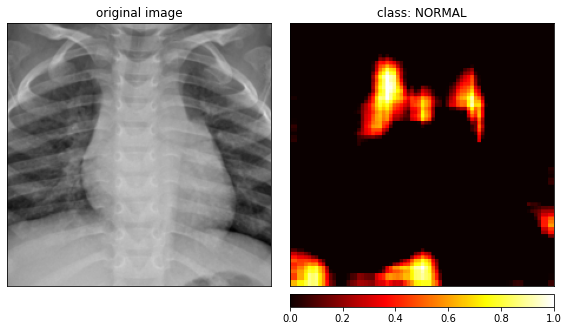

<Figure size 432x288 with 0 Axes>

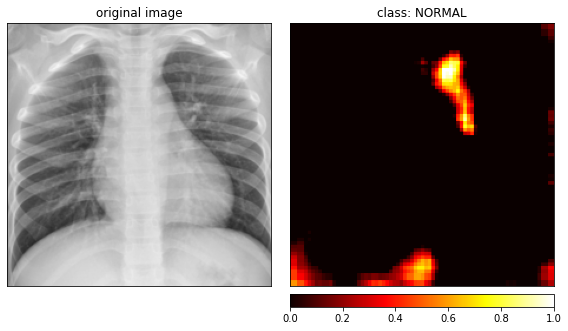

<Figure size 432x288 with 0 Axes>

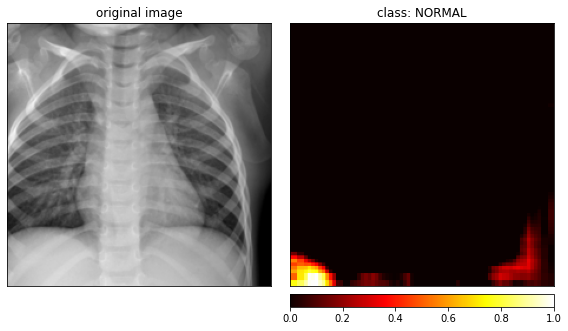

<Figure size 432x288 with 0 Axes>

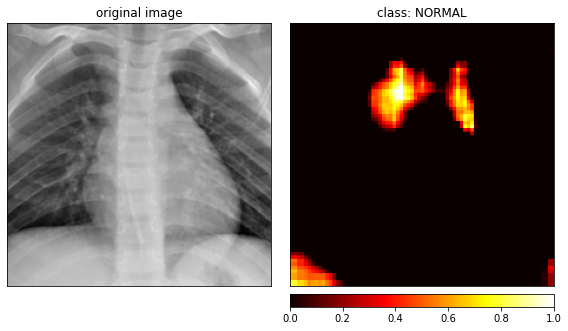

<Figure size 432x288 with 0 Axes>

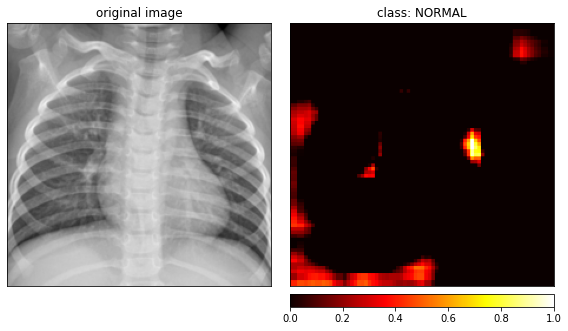

<Figure size 432x288 with 0 Axes>

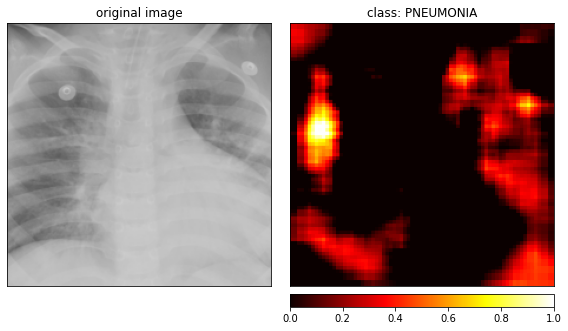

<Figure size 432x288 with 0 Axes>

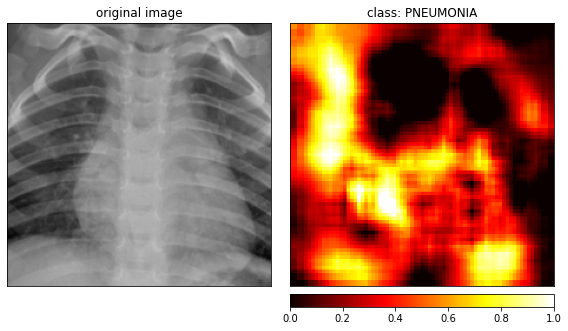

<Figure size 432x288 with 0 Axes>

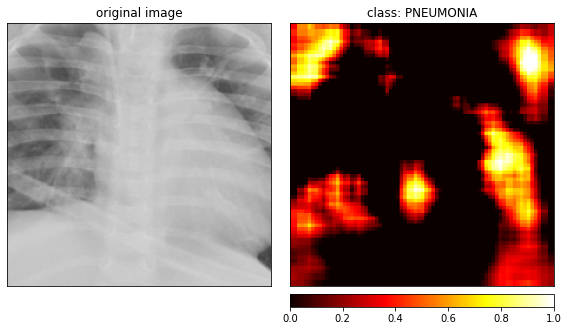

<Figure size 432x288 with 0 Axes>

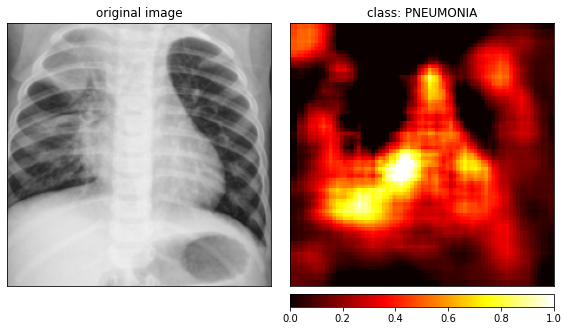

<Figure size 432x288 with 0 Axes>

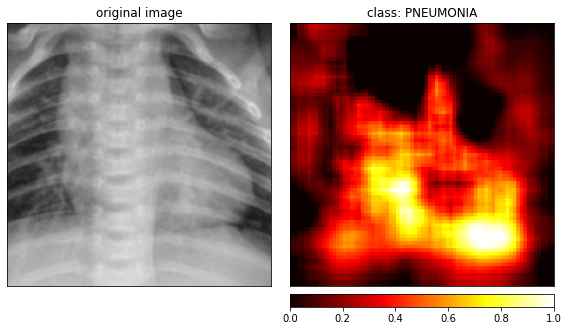

In [97]:
for i in range(len(rand_samples)):
    image = cv2.cvtColor(imread(rand_samples[i]), cv2.COLOR_BGR2RGB)
    img_pil = Image.fromarray(image)
    if classes[0] in rand_samples[i]:
      tgt = 1
    elif classes[1] in rand_samples[i]:
      tgt = 0

    im_pil_transformed = tr(img_pil)
    ins = im_pil_transformed.cuda().unsqueeze(0).type(torch.cuda.FloatTensor)

    baseline = torch.zeros (ins.shape)


    plt.figure()

    attributions_occ = occlusion.attribute(ins,
                                       strides = (3, 6, 6),
                                       target= tgt,
                                       sliding_window_shapes=(3,15, 15),
                                       baselines=0)
    
    _ = viz.visualize_image_attr_multiple( np.transpose( attributions_occ.squeeze().cpu().detach(), (1,2,0)).numpy()  ,
                                      np.transpose(im_pil_transformed.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "positive"],
                                      show_colorbar=True,
                                      titles = ['original image' ,  f'class: {classes[not tgt]}' ],
                                      cmap = 'hot',
                                      outlier_perc=2, 
                                      )          

it is evident that our model pays attention to the upper centeral and lower parts for healthy samples while in unhealthy samples with pneumonia the saliency map is distributed in the lungs and left and right regions.


## Integrated Gradients

In [105]:
baseline.is_cuda

False

<Figure size 432x288 with 0 Axes>

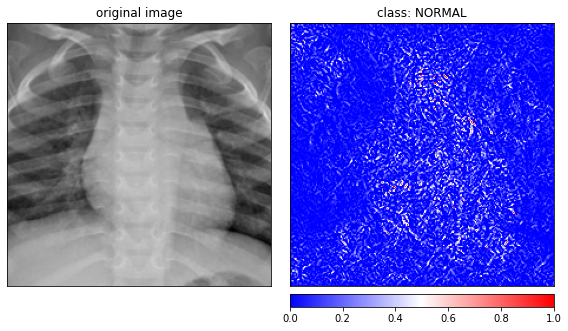

<Figure size 432x288 with 0 Axes>

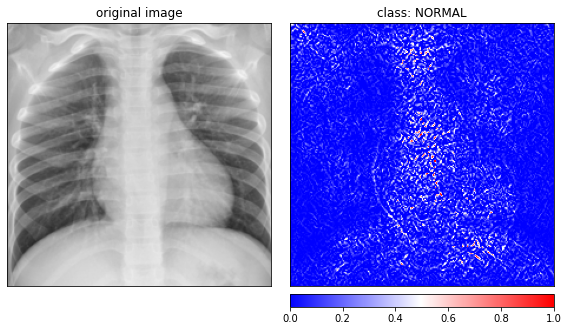

<Figure size 432x288 with 0 Axes>

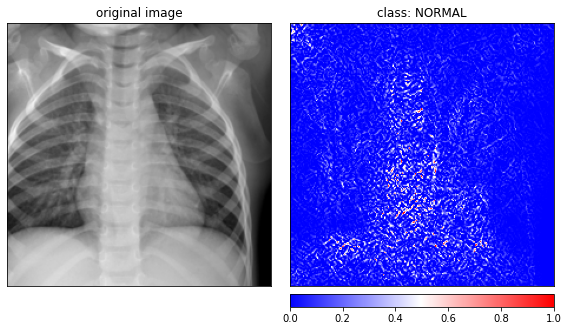

<Figure size 432x288 with 0 Axes>

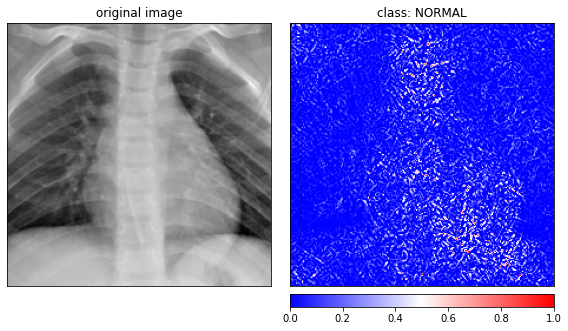

<Figure size 432x288 with 0 Axes>

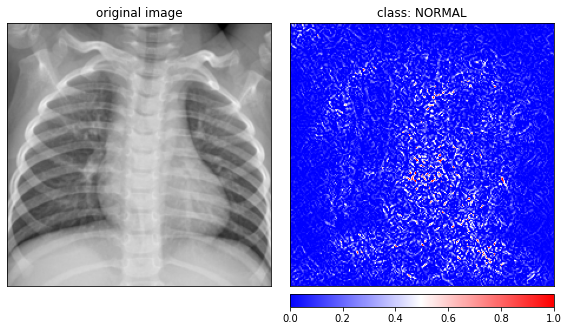

<Figure size 432x288 with 0 Axes>

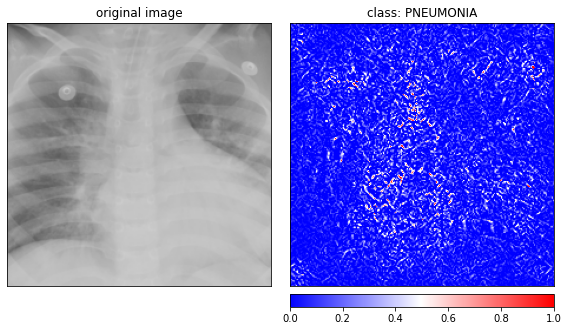

<Figure size 432x288 with 0 Axes>

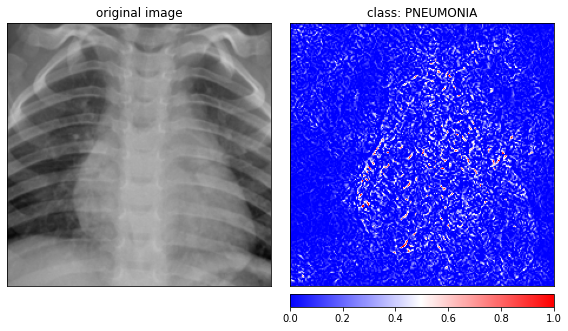

<Figure size 432x288 with 0 Axes>

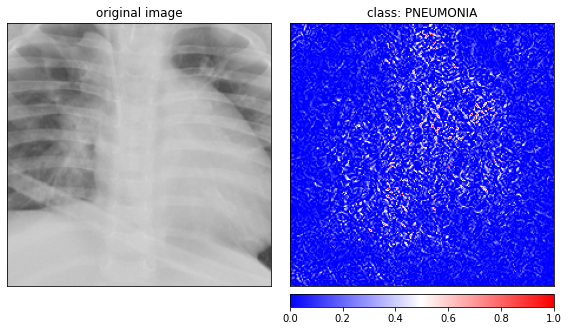

<Figure size 432x288 with 0 Axes>

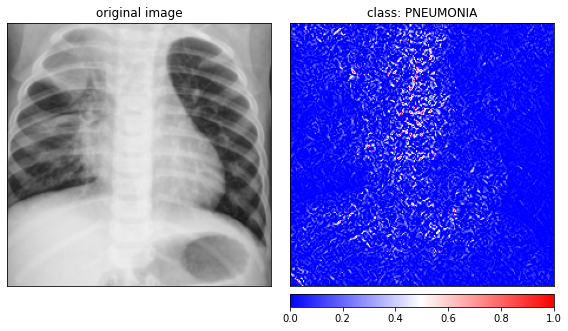

<Figure size 432x288 with 0 Axes>

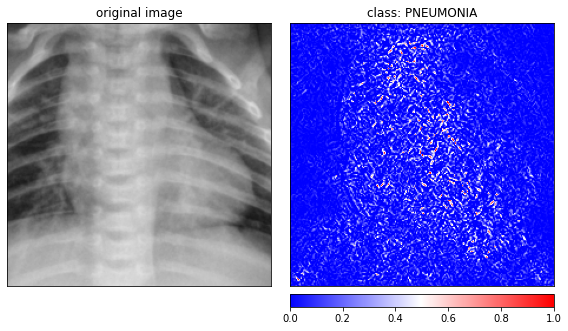

In [108]:
for i in range(len(rand_samples)):
    image = cv2.cvtColor(imread(rand_samples[i]), cv2.COLOR_BGR2RGB)
    img_pil = Image.fromarray(image)
    if classes[0] in rand_samples[i]:
      tgt = 1
    elif classes[1] in rand_samples[i]:
      tgt = 0

    im_pil_transformed = tr(img_pil)
    ins = im_pil_transformed.cuda().unsqueeze(0).type(torch.cuda.FloatTensor)

    baseline = torch.zeros (ins.shape).type(torch.cuda.FloatTensor)
    attributions, delta = integrated_gradients.attribute(ins, baseline, target= tgt, return_convergence_delta=True ,n_steps = 4)


    plt.figure()

    _ = viz.visualize_image_attr_multiple( np.transpose( attributions.squeeze().cpu().detach(), (1,2,0)).numpy()  ,
                                      np.transpose(im_pil_transformed.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      methods = ["original_image", "heat_map"],
                                      signs = ["all", "positive"], 
                                      show_colorbar=True, 
                                      titles = ['original image' ,  f'class: {classes[not tgt]}' ],
                                      cmap = 'bwr', 
                                      outlier_perc=2,  
                                      )    


it can be seen that the intensity mappings using this interpretation method are more centralized among healthy example while they are more distributed among patients with pneumonia

## SALIENCY (SIMPLE GRADIENT)

<Figure size 432x288 with 0 Axes>

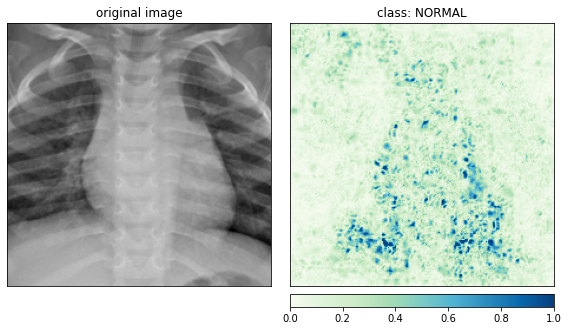

<Figure size 432x288 with 0 Axes>

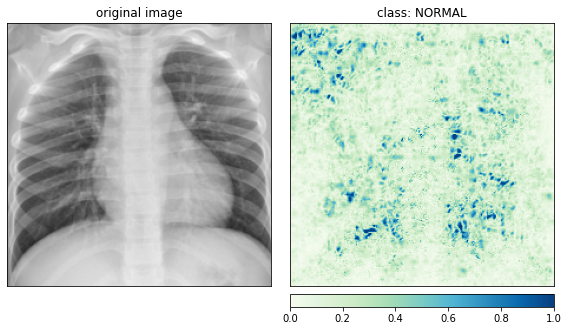

<Figure size 432x288 with 0 Axes>

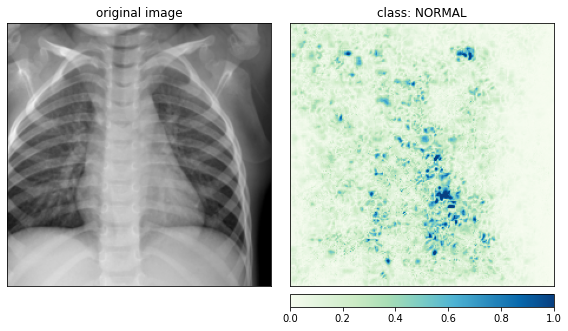

<Figure size 432x288 with 0 Axes>

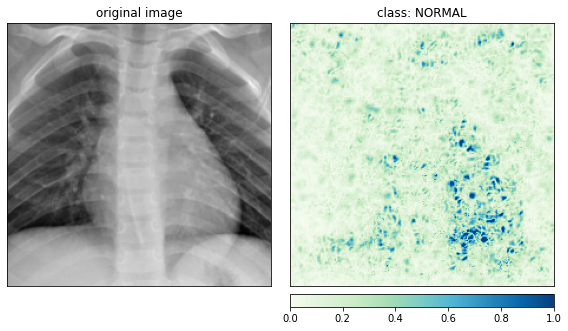

<Figure size 432x288 with 0 Axes>

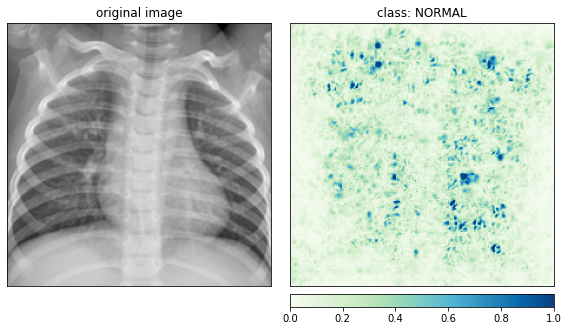

<Figure size 432x288 with 0 Axes>

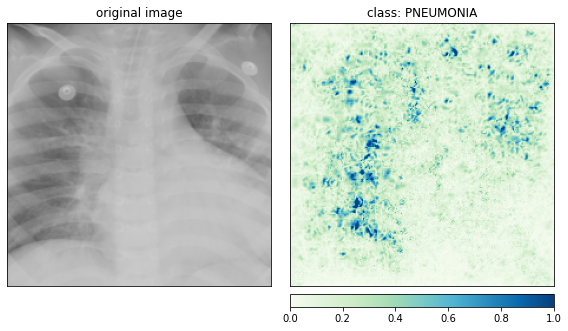

<Figure size 432x288 with 0 Axes>

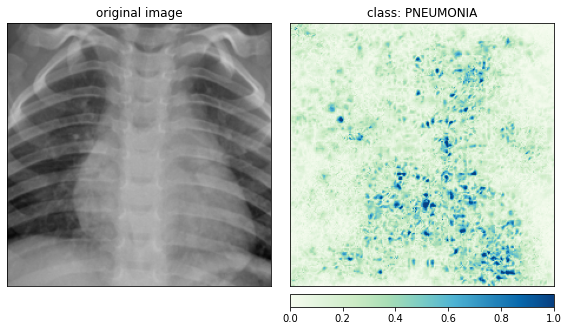

<Figure size 432x288 with 0 Axes>

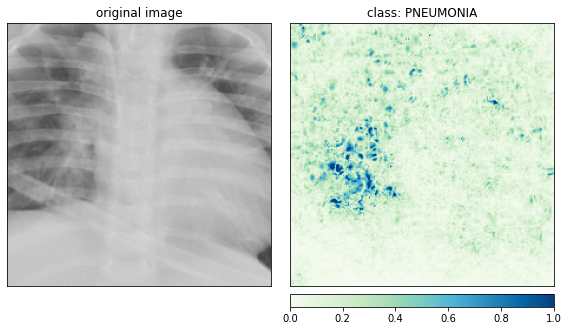

<Figure size 432x288 with 0 Axes>

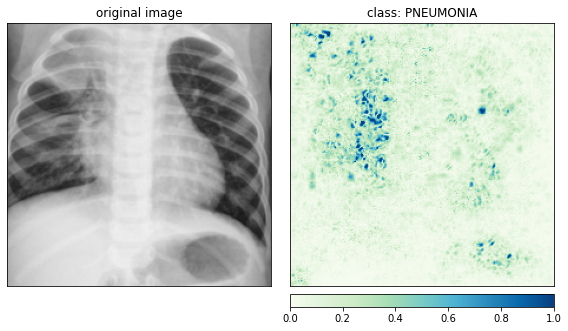

<Figure size 432x288 with 0 Axes>

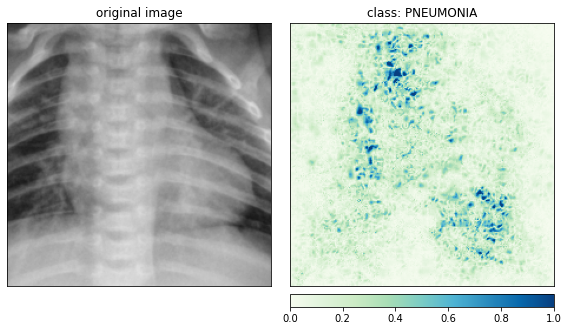

In [101]:
for i in range(len(rand_samples)):
    image = cv2.cvtColor(imread(rand_samples[i]), cv2.COLOR_BGR2RGB)
    img_pil = Image.fromarray(image)
    if classes[0] in rand_samples[i]:
      tgt = 1
    elif classes[1] in rand_samples[i]:
      tgt = 0

    im_pil_transformed = tr(img_pil)
    ins = im_pil_transformed.cuda().unsqueeze(0).type(torch.cuda.FloatTensor)

    baseline = torch.zeros (ins.shape)

    attribution_saliency = saliency.attribute(ins, target=tgt)
    plt.figure()
    
    attribution_saliency = saliency.attribute(ins, target= tgt,)
    _ = viz.visualize_image_attr_multiple( np.transpose( attribution_saliency.squeeze().cpu().detach(), (1,2,0)).numpy()  ,
                                      np.transpose(im_pil_transformed.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "positive"],
                                      show_colorbar=True,
                                      titles = ['original image' ,  f'class: {classes[not tgt]}' ],
                                      cmap = 'GnBu',
                                      outlier_perc=2, 
                                      )          

in simple gradient or saliency method it can be observed that among PNEUMONIA examples, the infected regions are distributed all over the lungs while they are more localized among healthy people.



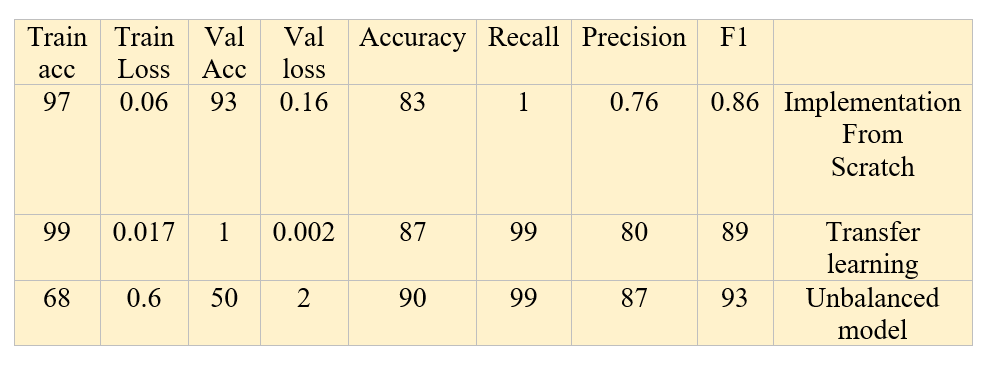

CONCLUSION

comparision of the results obtained from the models shows that transfer-learning based training with balanced dataset outperforms other types of training (training from scratch and transfer learning with unbalanced dataset)

# Resources



</div>


<font color=red size=4>


     
</font>
                <br/>
    </div>






</div>


<font color=red size=4>

Specify other resources (if any) you used for this question.(5 points)
     </font>
</font>
                <br/>
    </div>

https://www.youtube.com/watch?v=5fIy19GXAxI

https://blog.paperspace.com/model-interpretability-and-understanding-for-pytorch-using-captum/

https://captum.ai/